In [1]:
%matplotlib inline
%run ./Assignment2-utils.ipynb

# Image mosiacing pipeline
### Visualising the overlapping descriptors

 The number of descriptors in the left image:  (1415, 128)
 The number of descriptors in the right image:  (1439, 128)
The number of matches: 200
 The number of corresponding descriptors:  200


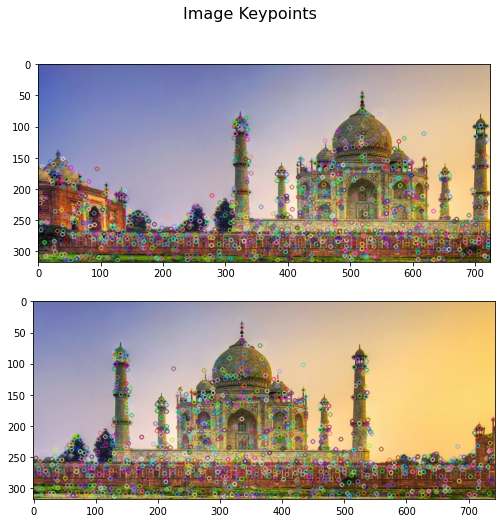

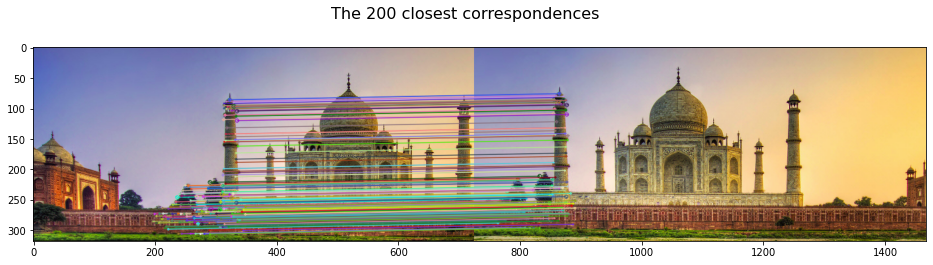

In [2]:
#if __name__ == "__main__":
imgL = read_image('./../images/imageMosaicing/2_1.png')
imgR = read_image('./../images/imageMosaicing/2_2.png')

start_time = time.time()
#does converting to greyscale make it faster?
#greyscale processing is faster and sift returned more keypoints on the greyscale image than the coloured image
#grayL = cv.cvtColor(imgL,cv.COLOR_BGR2GRAY)
#grayR = cv.cvtColor(imgR,cv.COLOR_BGR2GRAY)
#imgL = cv.cvtColor(imgL, cv.COLOR_BGR2RGB)
#imgR = cv.cvtColor(imgR, cv.COLOR_BGR2RGB)


keypointsL, descriptorsL = SIFT_descriptors(imgL) 
keypointsR, descriptorsR = SIFT_descriptors(imgR)
display1 = draw_and_display(imgL, keypointsL)
display2 = draw_and_display(imgR, keypointsR)

fig, [ax0, ax1] = plt.subplots(nrows = 2, ncols = 1, figsize = (16, 8)) #dpi = 160
ax0.imshow(display1)
ax1.imshow(display2)
fig.suptitle('Image Keypoints', fontsize=16)
end_time = time.time()
print(f"\033[22;33m The number of descriptors in the left image: \033[22;33m {descriptorsL.shape}\n \033[91mThe number of descriptors in the right image: \033[91m {descriptorsR.shape}")
#print(end_time - start_time)

pointsL, pointsR = SIFT_matching(descriptorsL, descriptorsR, imgL, keypointsL, imgR, keypointsR, display = True)



### Estimating a robust homography matrix between the images

In [80]:
H = get_homography(pointsL, pointsR)

homo_pointsL = get_homo(pointsL); homo_pointsR = get_homo(pointsR)
print(f"\033[45;75m The minimum rmse error is: \033[45;75m {get_rmse(homo_pointsL, homo_pointsR, H)}")
H_RANSAC = get_homography_ransac(homo_pointsL, homo_pointsR, displayError = 1)
img1 = read_image('./../images/imageMosaicing/2_1.png')
img2 = read_image('./../images/imageMosaicing/2_2.png')
img3 = read_image('./../images/imageMosaicing/2_3.png')
img4 = read_image('./../images/imageMosaicing/2_4.png')
img5 = read_image('./../images/imageMosaicing/2_5.png')
img6 = read_image('./../images/imageMosaicing/2_6.png')

#print(H)
#print(H_RANSAC)

 The minimum rmse error is:  7.586489532168153e-06
 The minimum rmse error using RANSAC is:  5.678391303917834e-06


### Stitching images together using the homography matrix


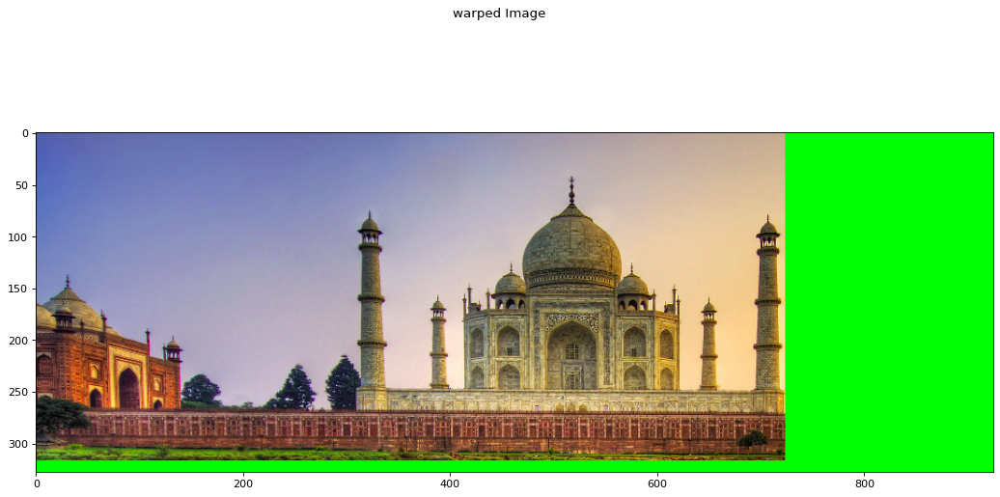

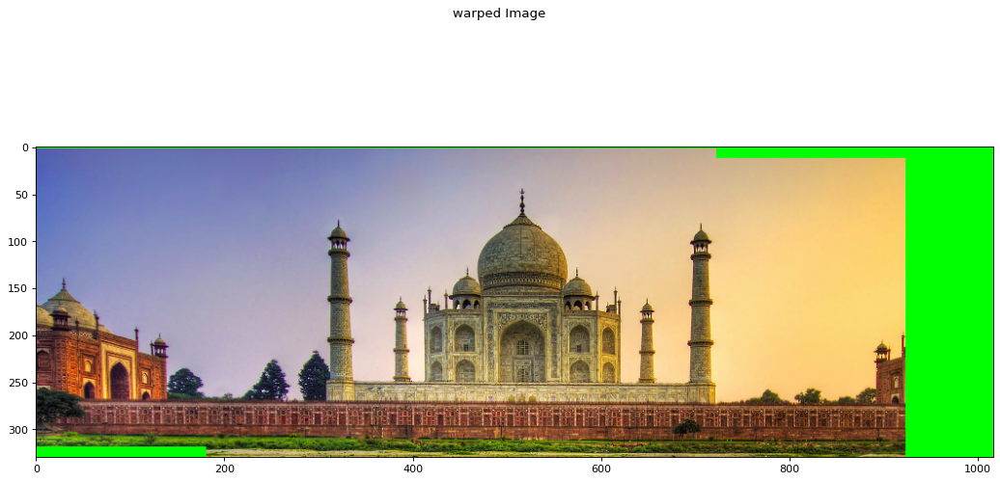

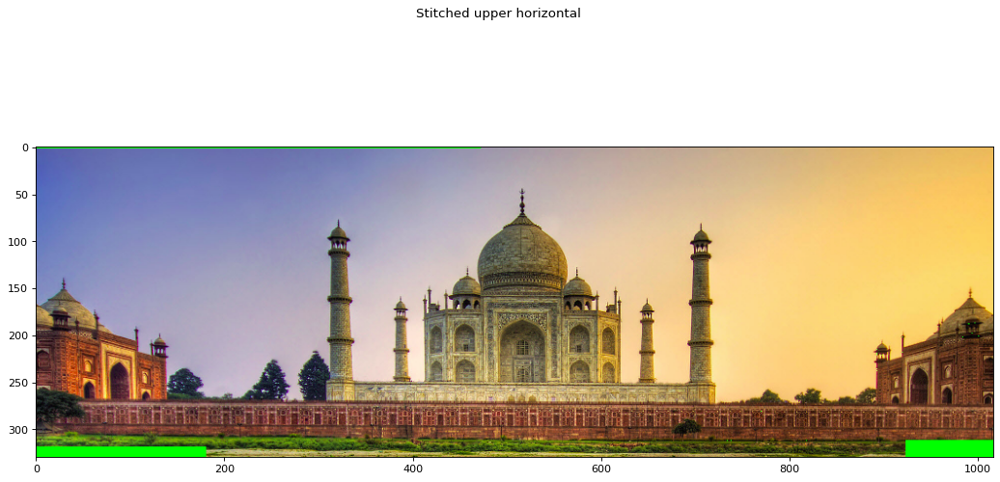

In [5]:
stitchedUpperHorizontal = get_stitched(get_stitched(img1, img2), img3)
fig, ax = plt.subplots(figsize=(16,8),dpi = 80)
ax.imshow(stitchedUpperHorizontal) 
fig.suptitle("Stitched upper horizontal")
plt.show() 


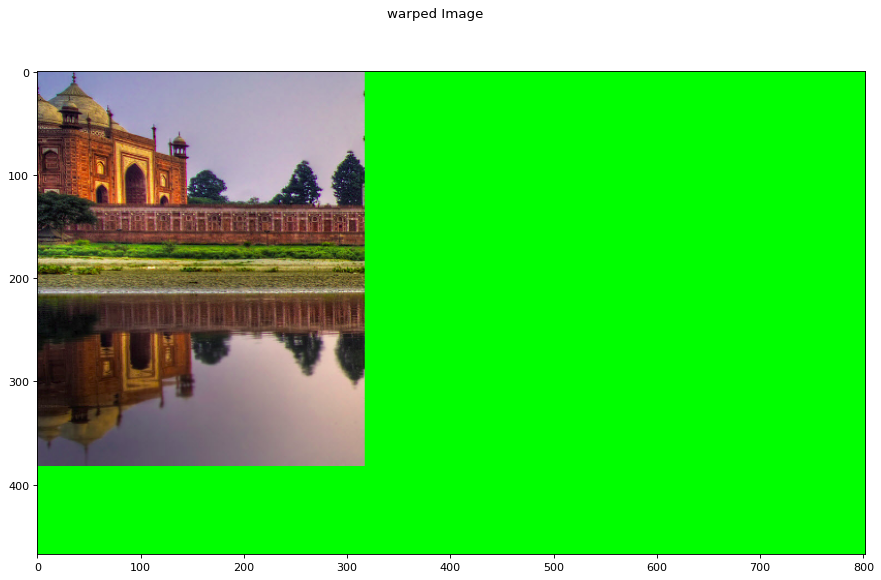

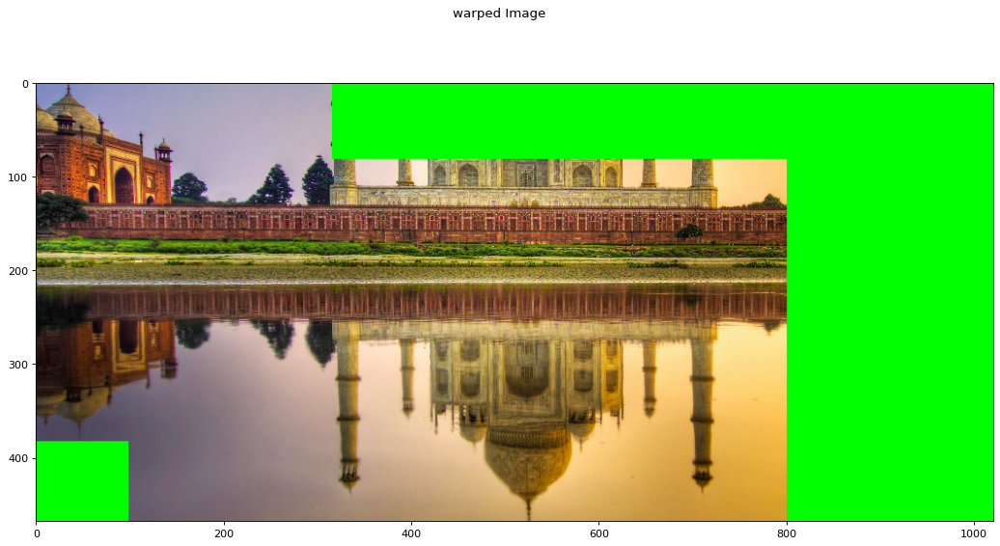

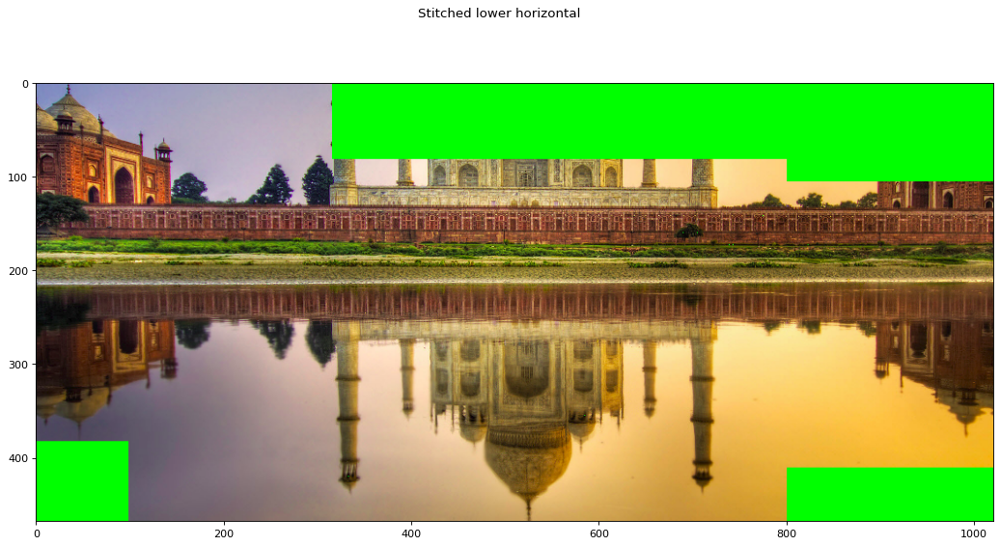

In [6]:
stitchedLowerHorizontal = get_stitched(get_stitched(img4, img5), img6)
fig, ax = plt.subplots(figsize=(16,8),dpi = 80)
ax.imshow(stitchedLowerHorizontal) 
fig.suptitle("Stitched lower horizontal")
plt.show() 

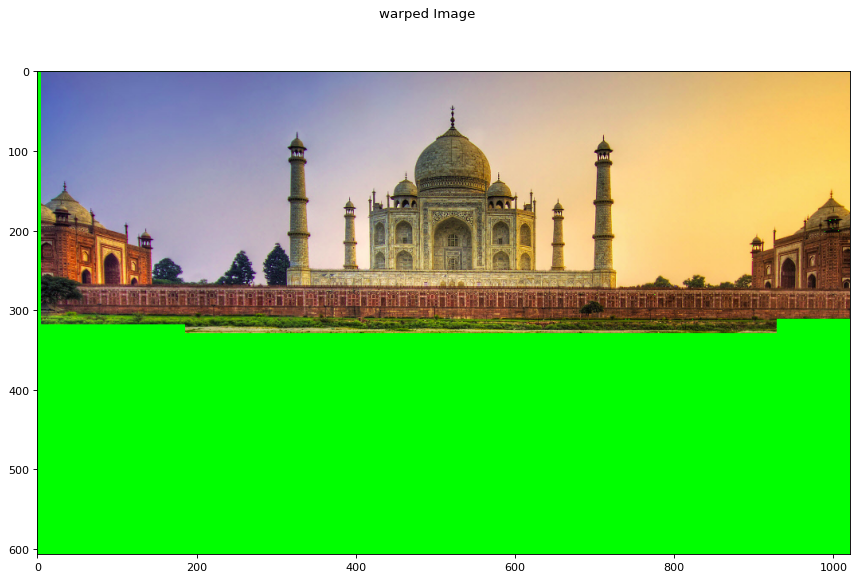

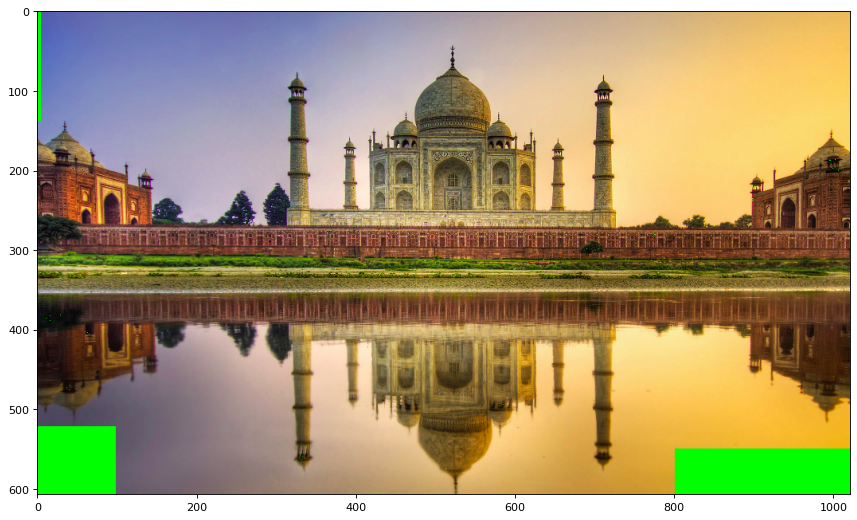

In [7]:
stitchedImage = get_stitched(stitchedUpperHorizontal, stitchedLowerHorizontal)
fig, ax = plt.subplots(figsize=(16,8),dpi = 80)
ax.imshow(stitchedImage) 
plt.show() 

### Stitching together images from various datasets

In [84]:
img1 = resize(read_image('./../images/imageMosaicing/1_1.jpg'))
img2 = resize(read_image('./../images/imageMosaicing/1_2.jpg'))
img3 = resize(read_image('./../images/imageMosaicing/1_3.jpg'))
img4 = resize(read_image('./../images/imageMosaicing/1_4.jpg'))


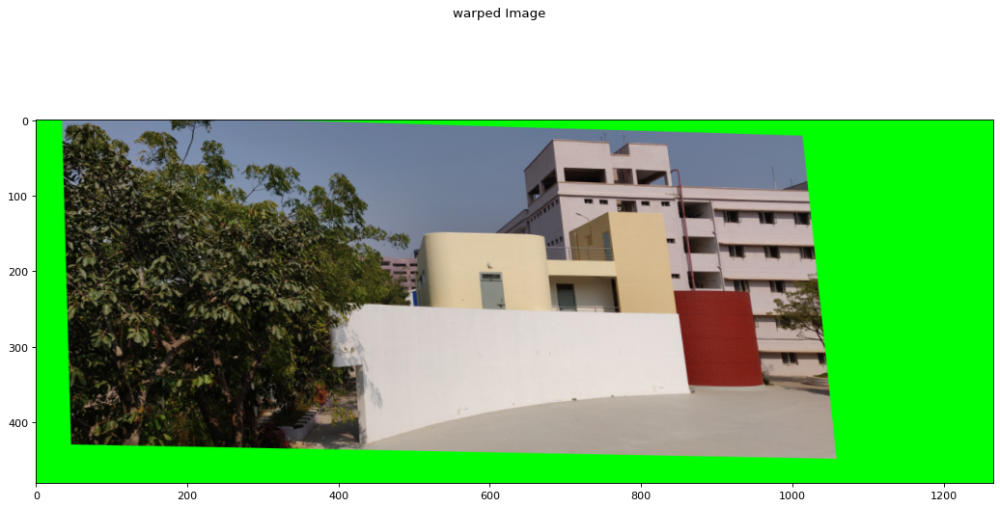

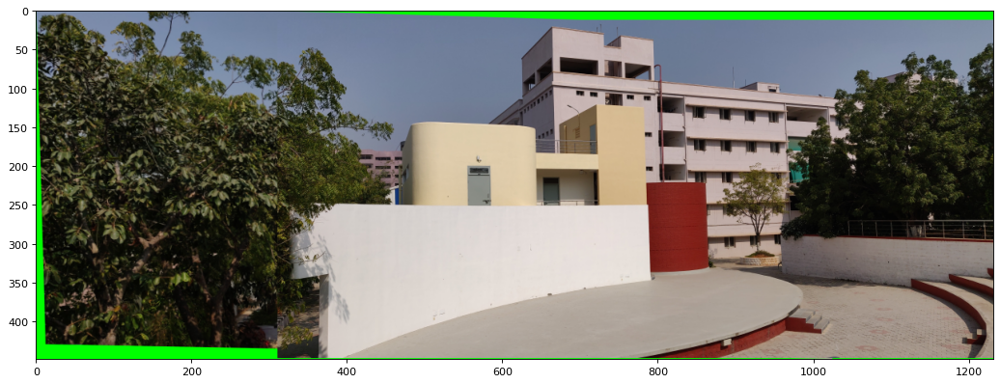

In [41]:
amphi1 = get_stitched(img1, img2)
fig, ax = plt.subplots(figsize=(16,8),dpi = 80)
ax.imshow(amphi1) 
plt.show() 

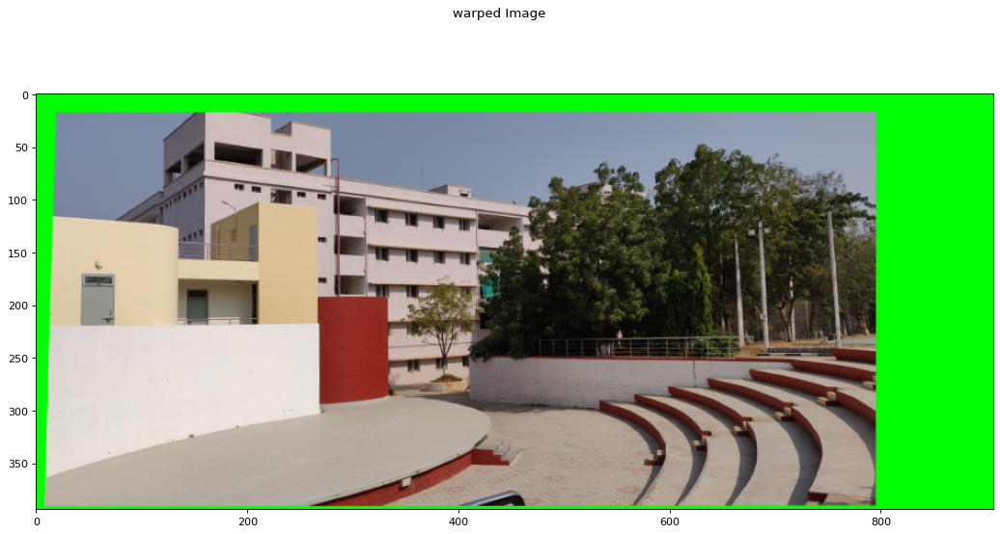

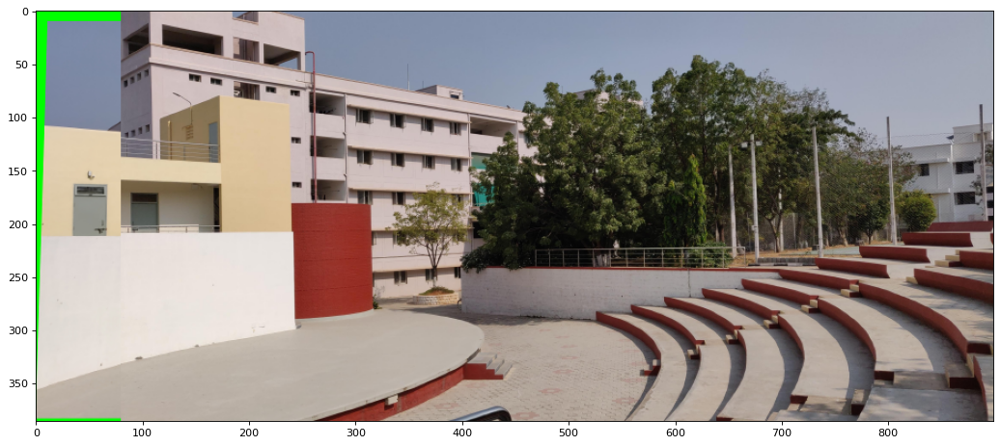

In [88]:
amphi2 = get_stitched(img3, img4)
fig, ax = plt.subplots(figsize=(16,8),dpi = 80)
ax.imshow(amphi2) 
plt.show() 

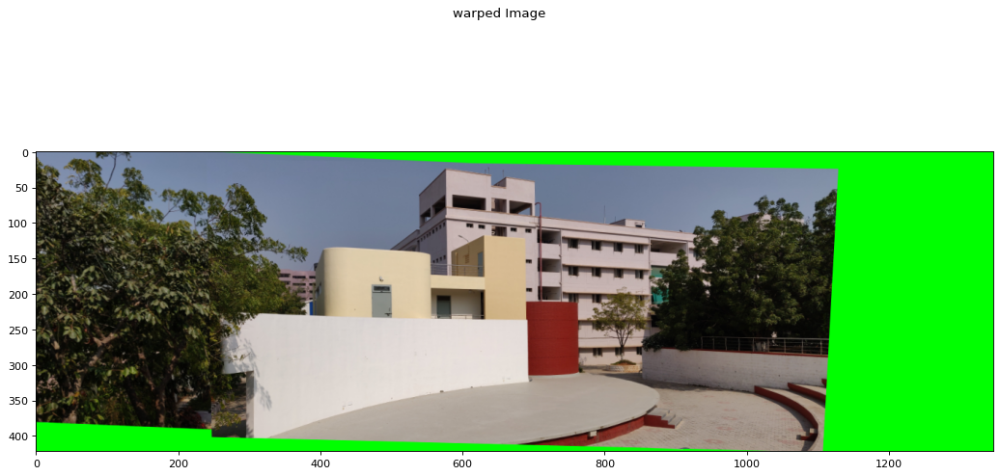

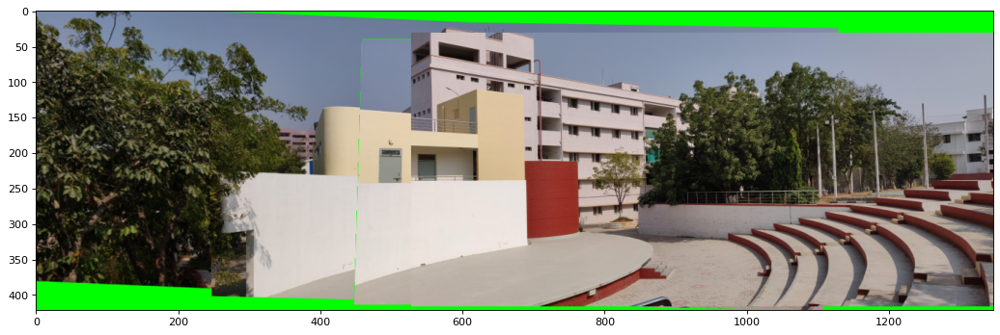

In [89]:
amphiStitched = get_stitched(amphi1, amphi2)
fig, ax = plt.subplots(figsize=(16,8),dpi = 80)
ax.imshow(amphiStitched) 
plt.show() 

In [109]:
img1 = read_image('./../images/imageMosaicing/3_1.png')
img2 = read_image('./../images/imageMosaicing/3_2.png')


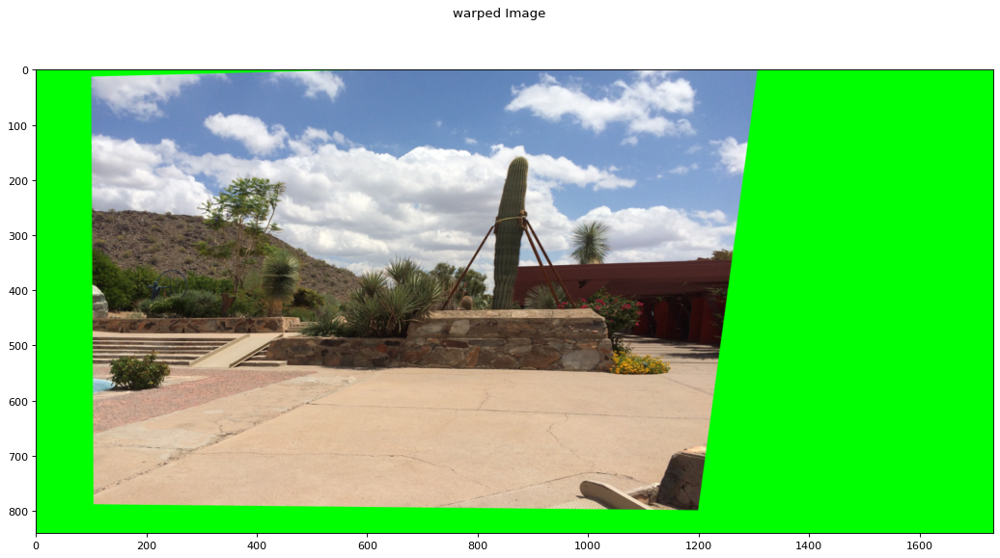

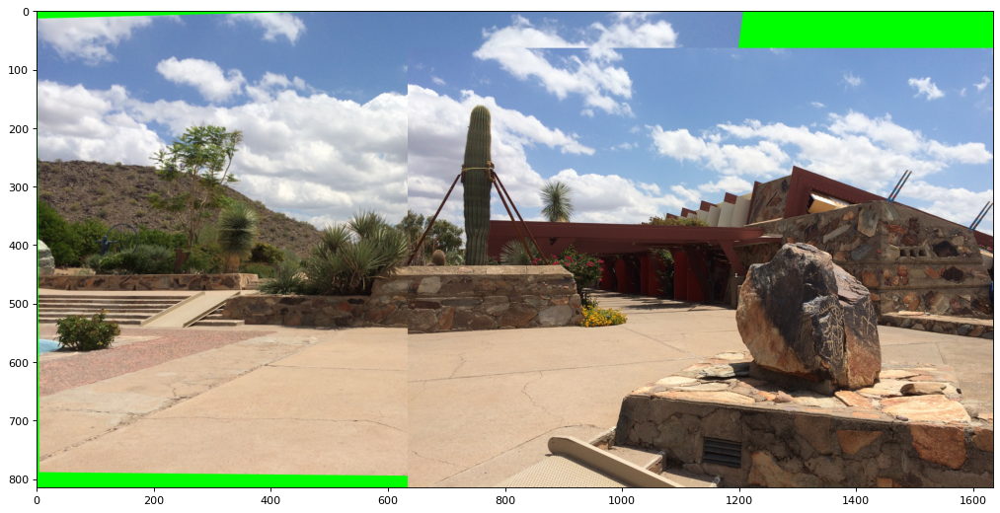

In [108]:
stitchedImage = get_stitched(img1, img2)
fig, ax = plt.subplots(figsize=(16,8),dpi = 80)
ax.imshow(stitchedImage) 
plt.show() 

In [6]:
img1 = cv.imread('./../images/imageMosaicing/4_1.jpg')
img1 = cv.cvtColor(img1, cv.COLOR_BGR2RGB)
img2 = cv.imread('./../images/imageMosaicing/4_2.jpg')
img2 = cv.cvtColor(img2, cv.COLOR_BGR2RGB)

The number of matches: 4
 The number of corresponding descriptors:  4


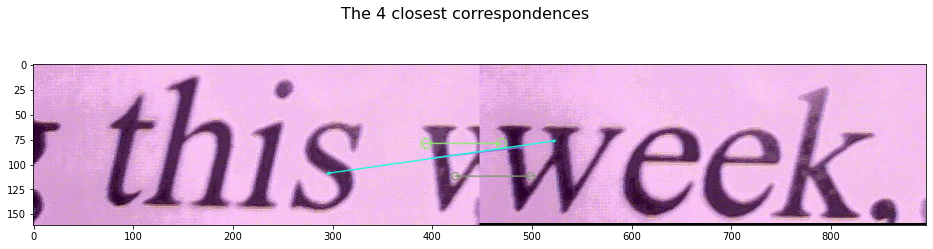

In [8]:
#notEnoughCorrespondances = horizontal_stitch(img1, img2)
_, _, _ = get_points_descriptors(img1, img2, display = True)

'''

Clearly, there aren't enough correct correspondances to compute a homography.

'''


In [71]:
img1 = resize(read_image('./../images/imageMosaicing/5_1.jpg'))
img2 = resize(read_image('./../images/imageMosaicing/5_2.jpg'))
img3 = resize(read_image('./../images/imageMosaicing/5_3.jpg'))
img4 = resize(read_image('./../images/imageMosaicing/5_4.jpg'))


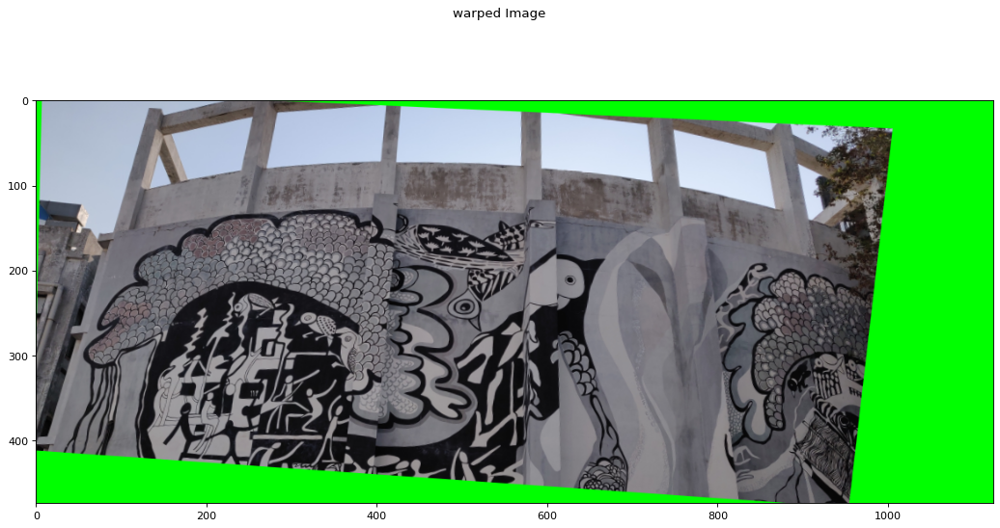

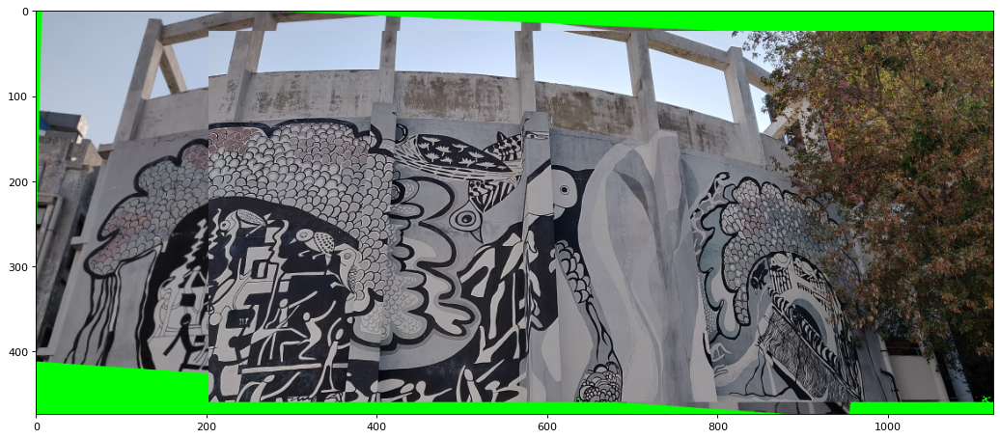

In [72]:
part1 = get_stitched(img1, img2)
fig, ax = plt.subplots(figsize=(16,8),dpi = 80)
ax.imshow(part1) 
plt.show() 

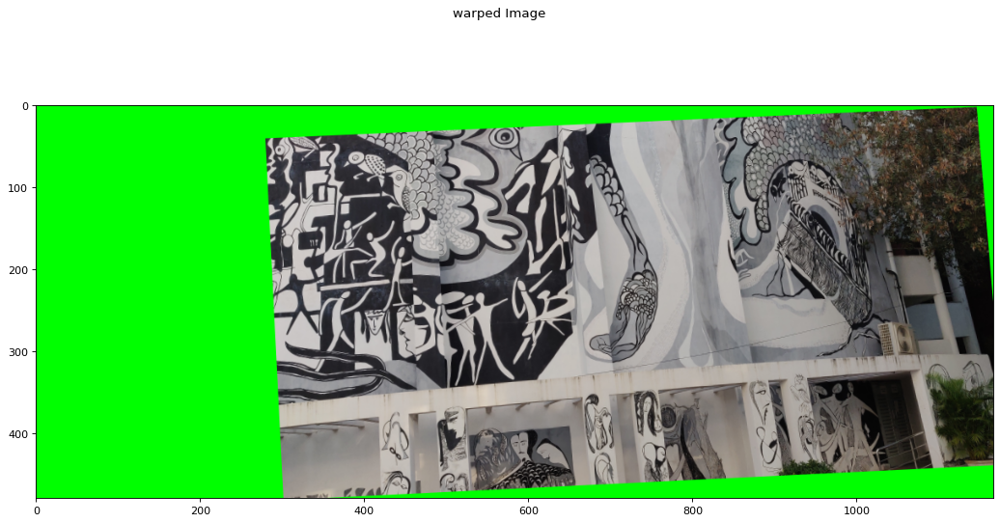

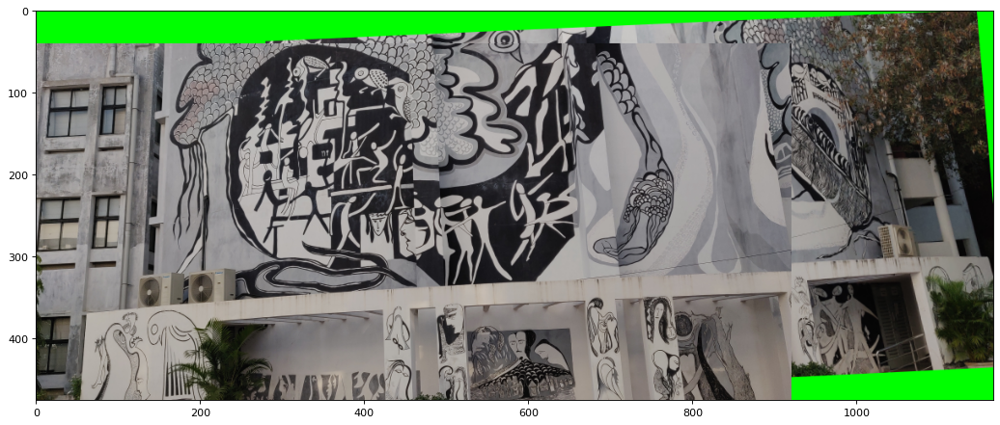

In [79]:
part2 = get_stitched(img3, img4)
fig, ax = plt.subplots(figsize=(16,8),dpi = 80)
ax.imshow(part2) 
plt.show() 

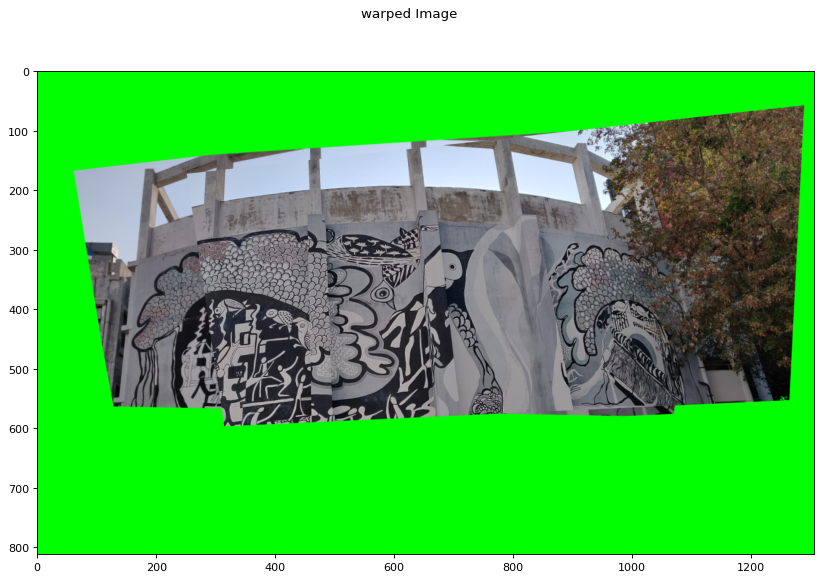

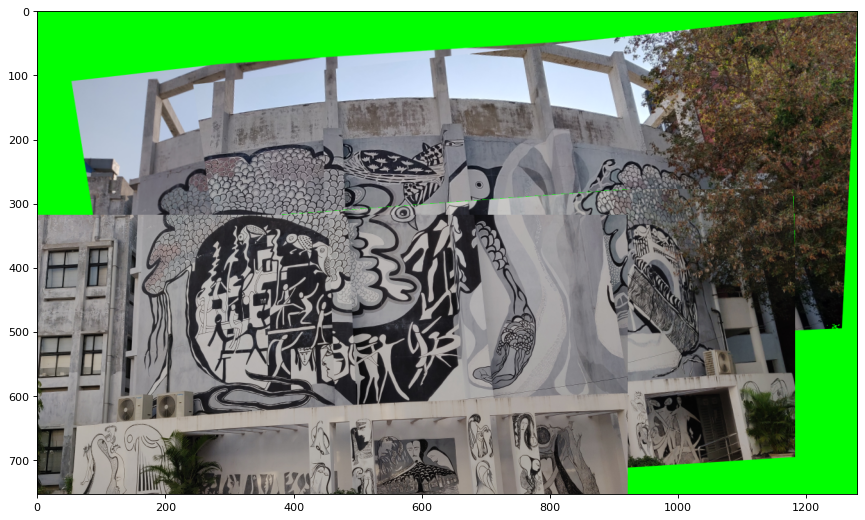

In [77]:
stitchedImage = get_stitched(part1, part2)
fig, ax = plt.subplots(figsize=(16,8),dpi = 80)
ax.imshow(stitchedImage) 
plt.show() 

In [2]:
img1 = read_image('./../images/imageMosaicing/toStitch1.jpeg')
img2 = read_image('./../images/imageMosaicing/toStitch2.jpeg')
img3 = read_image('./../images/imageMosaicing/toStitch3.jpeg')
img4 = read_image('./../images/imageMosaicing/toStitch4.jpeg')
img5 = read_image('./../images/imageMosaicing/toStitch5.jpeg')
# img6 = read_image('./../images/imageMosaicing/2_6.png')

### Stitching together out-of-order images

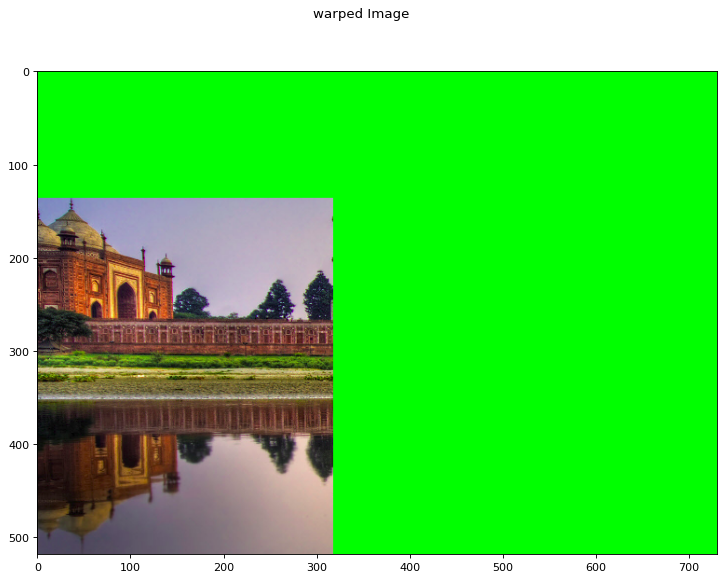

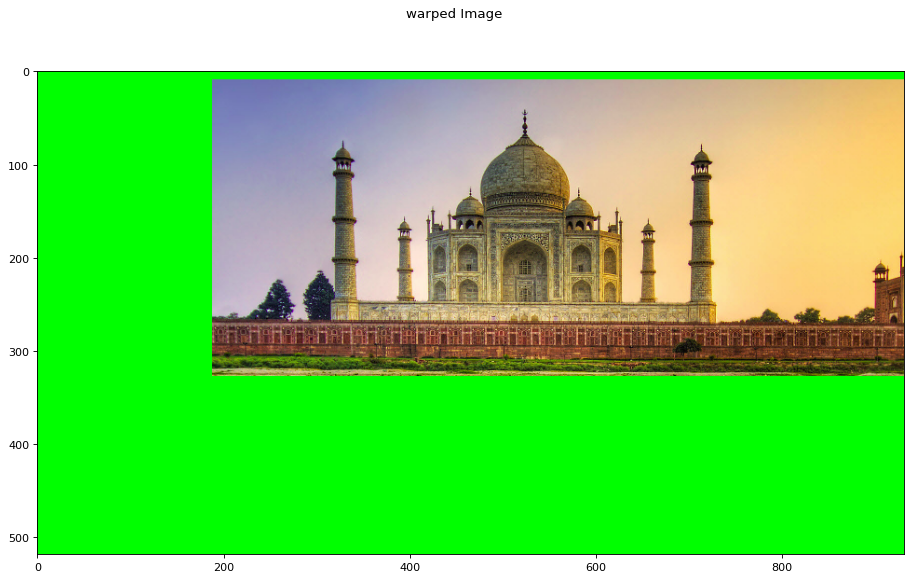

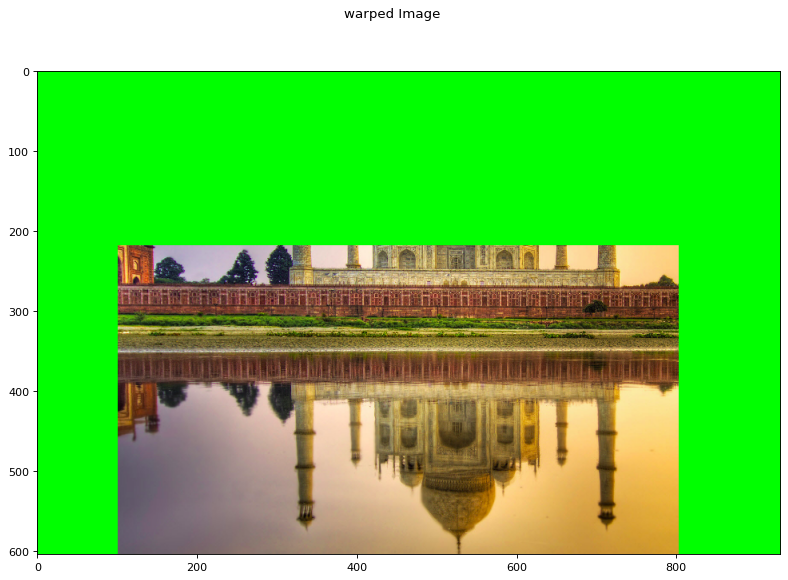

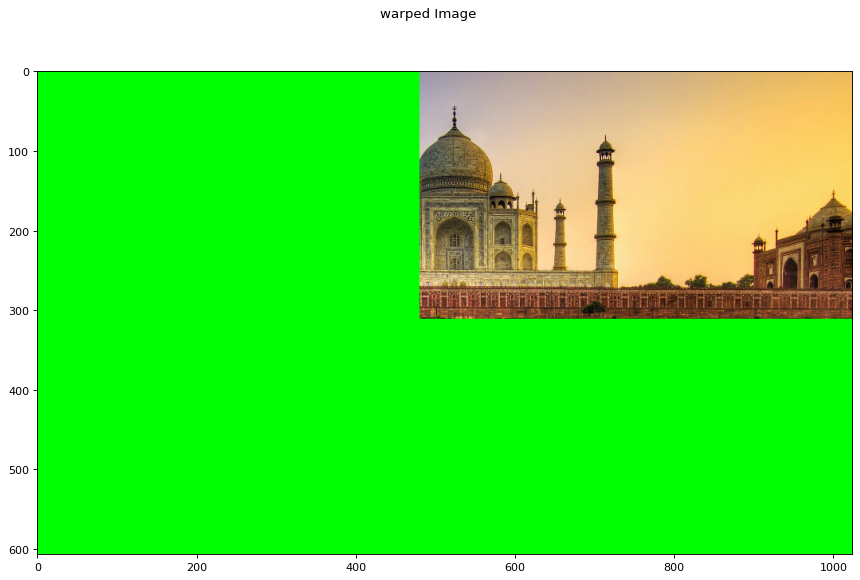

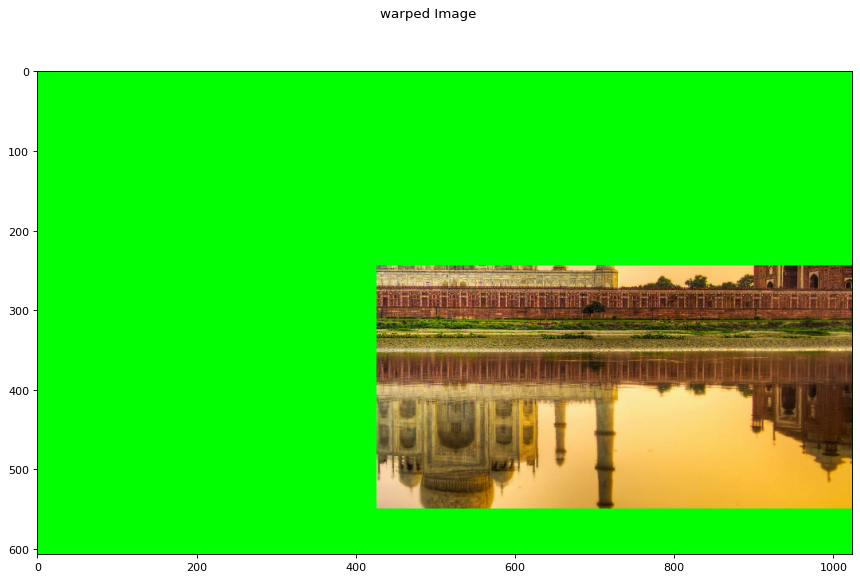

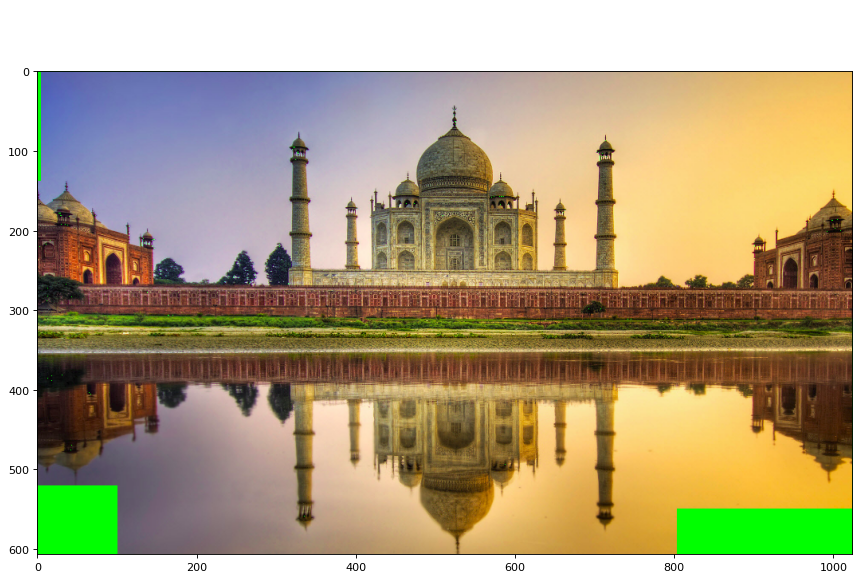

In [83]:
imagesToStitch=[]
for i in [1,4,2,5,3,6]:
    img =read_image("./../images/imageMosaicing/2_"+str(i)+".png")
    imagesToStitch.append(img)

randomStitch = stitch_multiple(imagesToStitch)
plot(randomStitch)

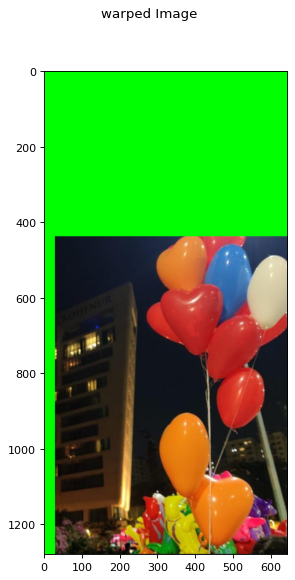

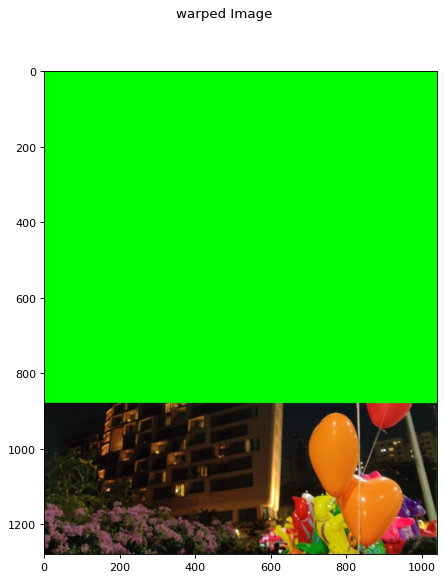

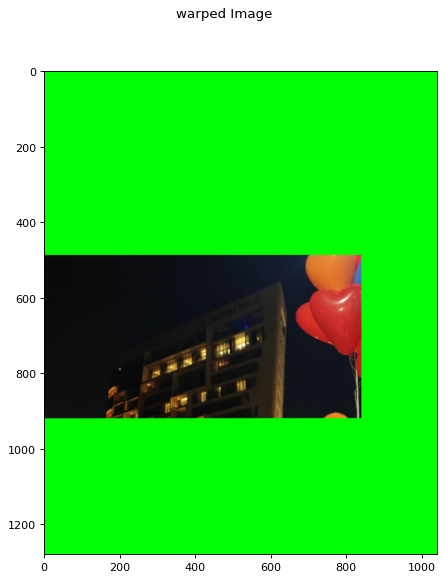

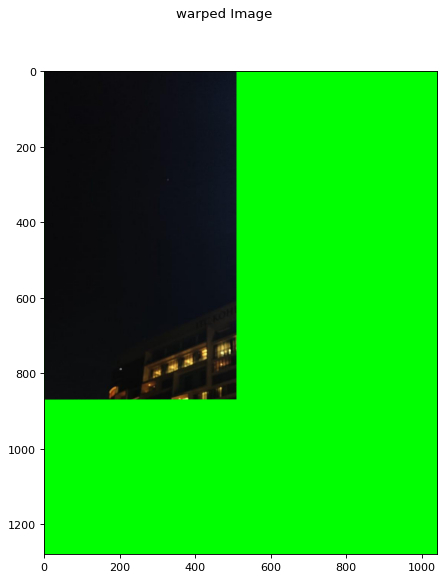

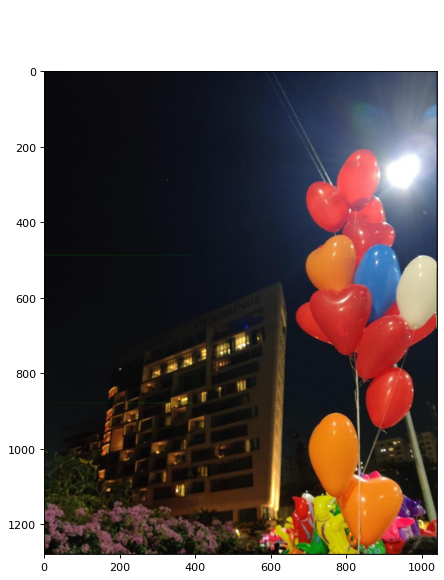

In [5]:
imagesToStitch = []
for i in [2, 3, 1, 4, 5]:
    img = read_image("./../images/imageMosaicing/toStitch"+str(i)+".jpeg")
    imagesToStitch.append(img)
    
plot(stitch_multiple(imagesToStitch))